## Finetune Maskformer for Flood Area Segmentation
Dataset: [Flood Area Segmentation on Kaggle](https://www.kaggle.com/datasets/faizalkarim/flood-area-segmentation/data)

[Reference notebook on Finetuning of Maskformer](https://github.com/NielsRogge/Transformers-Tutorials/blob/master/MaskFormer/Fine-tuning/Fine_tuning_MaskFormerForInstanceSegmentation_on_semantic_sidewalk.ipynb)

BibTeX entry:
```bibtex
@software{Rogge_Transformers_Tutorials_2020,
author = {Rogge, Niels},
doi = {10.5281/zenodo.1234},
month = sep,
title = {{Transformers Tutorials"}},
url = {https://github.com/NielsRogge/Transformers-Tutorials},
version = {1.0},
year = {2020}
}
```

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image
from tqdm import tqdm
from datasets import Dataset, DatasetDict, Image as HFDatasetImage
import torch
from torch.utils.data import Dataset as TorchDataset
from torch.utils.data import DataLoader
import albumentations as A
np.random.seed(42)
torch.manual_seed(42)
%matplotlib inline

### Load data

#### Read files

In [2]:
# Path to the director where images for semantic segmentation are stored
IMAGES_DIR = 'data/Image/'
# Path to the directory where labels for semantic segmentation are stored
LABELS_DIR = 'data/Mask/'
IMG_EXT = 'jpg'
LABEL_EXT = 'png'

In [3]:
metadata = pd.read_csv('data/metadata.csv')
metadata.head()

,Image,Mask
0,0.jpg,0.png
1,1.jpg,1.png
2,2.jpg,2.png
3,3.jpg,3.png
4,4.jpg,4.png


In [4]:
def get_all_images_labels(IMAGES_DIR, LABELS_DIR, metadata):
    """
    Return the list of all valid images and labels
    """
    images = []
    labels = []
    min_h = 1e6; max_h = 0
    min_w = 1e6; max_w = 0
    for _, row in metadata.iterrows():
        image = os.path.join(IMAGES_DIR, row['Image'])
        label = os.path.join(LABELS_DIR, row['Mask'])
        img_arr = np.array(Image.open(image))
        label_arr = np.array(Image.open(label))
        if (img_arr.ndim == 3) and (img_arr.shape[2] == 3) and (img_arr.shape[:-1] == label_arr.shape):
            min_h = min(min_h, img_arr.shape[0]); max_h = max(max_h, img_arr.shape[0])
            min_w = min(min_w, img_arr.shape[1]); max_w = max(max_w, img_arr.shape[1])
            images.append(image)
            labels.append(label)
        else:
            print(f"Skipping image {row['Image']} and mask {row['Mask']}")
    print(f"Min height: {min_h}, Max height: {max_h}")
    print(f"Min width: {min_w}, Max width: {max_w}")
    return images, labels

In [5]:
# Take the first TRAIN_SIZE images for training
all_images, all_labels = get_all_images_labels(IMAGES_DIR, LABELS_DIR, metadata)

print(len(all_images), len(all_labels))
print(all_images[:5])
print(all_labels[:5])

Skipping image 0.jpg and mask 0.png
Skipping image 2.jpg and mask 2.png


Skipping image 14.jpg and mask 14.png
Skipping image 15.jpg and mask 15.png


Skipping image 2052.jpg and mask 2052.png
Skipping image 2053.jpg and mask 2053.png


Skipping image 3048.jpg and mask 3048.png


Skipping image 3059.jpg and mask 3059.png


Skipping image 1061.jpg and mask 1061.png


Skipping image 1079.jpg and mask 1079.png


Min height: 219, Max height: 3648
Min width: 330, Max width: 5472
280 280
['data/Image/1.jpg', 'data/Image/3.jpg', 'data/Image/4.jpg', 'data/Image/5.jpg', 'data/Image/6.jpg']
['data/Mask/1.png', 'data/Mask/3.png', 'data/Mask/4.png', 'data/Mask/5.png', 'data/Mask/6.png']


In [6]:
TRAIN_SIZE = 200 # Number of images to use for training
VAL_SIZE = 20 # Number of images to use for validation
TEST_SIZE = 60 # Number of images to use for testing

In [7]:
image_paths_train = all_images[:TRAIN_SIZE]
label_paths_train = all_labels[:TRAIN_SIZE]

print(image_paths_train[:5])
print(label_paths_train[:5])

image_paths_val = all_images[TRAIN_SIZE:TRAIN_SIZE+VAL_SIZE]
label_paths_val = all_labels[TRAIN_SIZE:TRAIN_SIZE+VAL_SIZE]

print(image_paths_val[:5])
print(label_paths_val[:5])

image_paths_test = all_images[-TEST_SIZE:]
label_paths_test = all_labels[-TEST_SIZE:]

print(image_paths_test[:5])
print(label_paths_test[:5])

['data/Image/1.jpg', 'data/Image/3.jpg', 'data/Image/4.jpg', 'data/Image/5.jpg', 'data/Image/6.jpg']
['data/Mask/1.png', 'data/Mask/3.png', 'data/Mask/4.png', 'data/Mask/5.png', 'data/Mask/6.png']
['data/Image/1006.jpg', 'data/Image/1007.jpg', 'data/Image/1008.jpg', 'data/Image/1009.jpg', 'data/Image/1010.jpg']
['data/Mask/1006.png', 'data/Mask/1007.png', 'data/Mask/1008.png', 'data/Mask/1009.png', 'data/Mask/1010.png']
['data/Image/1026.jpg', 'data/Image/1027.jpg', 'data/Image/1028.jpg', 'data/Image/1029.jpg', 'data/Image/1030.jpg']
['data/Mask/1026.png', 'data/Mask/1027.png', 'data/Mask/1028.png', 'data/Mask/1029.png', 'data/Mask/1030.png']


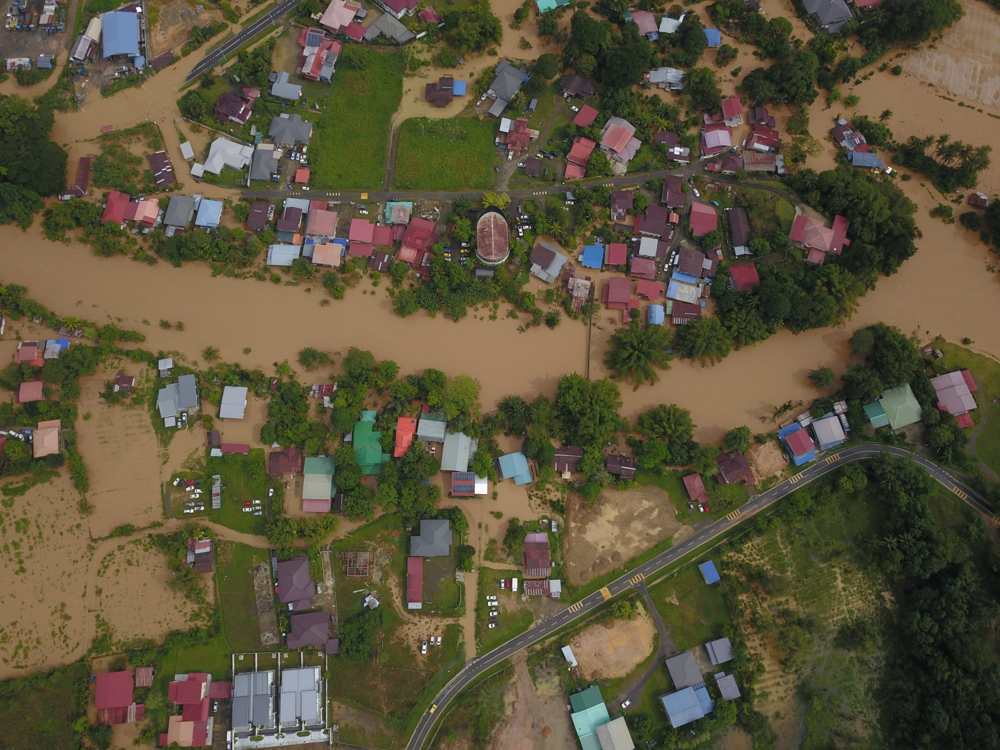

In [8]:
Image.open(image_paths_train[5])

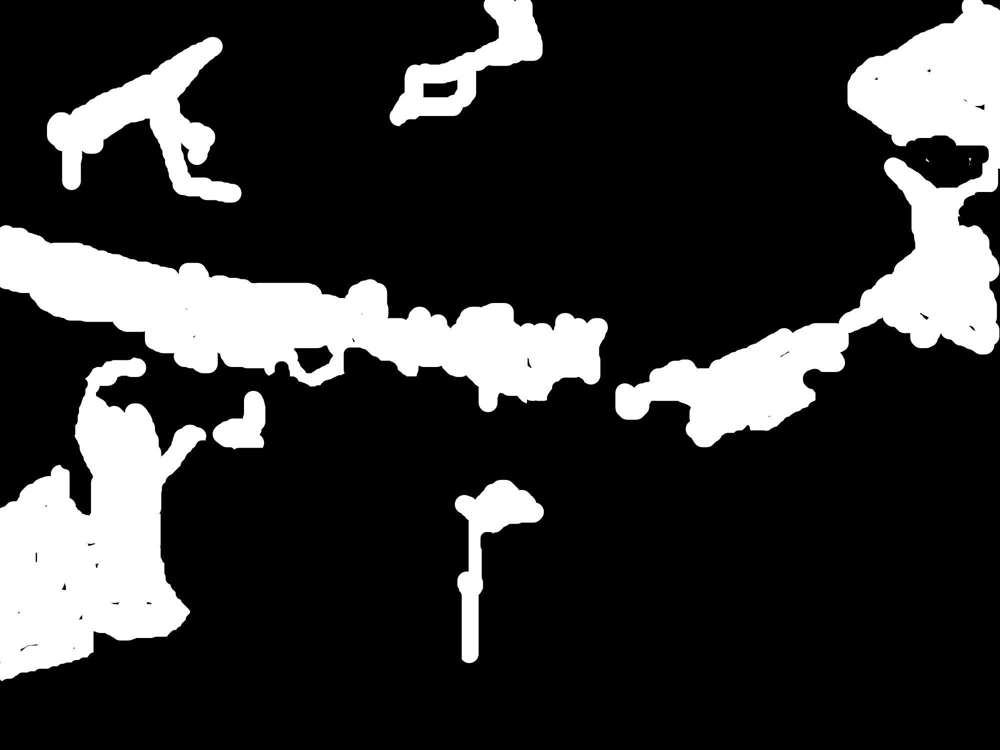

In [9]:
Image.open(label_paths_train[5])

**Note:** White color in mask means flooded area and black color means non-flooded area.

#### Convert into Hugging Face Dataset format

In [10]:
def convert_to_binary_mask(label_path, threshold=128):
    """
    Convert a label image to a binary mask using a threshold
    """
    # Load the label image as a numpy array
    label_image = np.array(Image.open(label_path))
    
    # Apply thresholding to create a binary mask (values >= threshold will be 2, others 1)
    binary_mask = (label_image >= threshold).astype(np.uint8)
    
    return binary_mask

def create_dataset(image_paths, label_paths, threshold=128):
    # Create Dataset from image paths and label paths
    dataset = Dataset.from_dict({"image": image_paths,
                                 "label": [convert_to_binary_mask(label_path, threshold) for label_path in label_paths]})
    
    # Cast the "image" column to use the HFDatasetImage class to handle image loading
    dataset = dataset.cast_column("image", HFDatasetImage())

    # dataset = dataset.cast_column("label", HFDatasetImage())
    
    return dataset

train_dataset = create_dataset(image_paths_train, label_paths_train)
val_dataset = create_dataset(image_paths_val, label_paths_val)
test_dataset = create_dataset(image_paths_test, label_paths_test)

In [11]:
dataset = DatasetDict({
    "train": train_dataset,
    "val": val_dataset,
    "test": test_dataset
  }
)

In [12]:
train_ds = dataset["train"]
val_ds = dataset["val"]
test_ds = dataset["test"]

##### Plot a sample

(1500, 2000, 3)


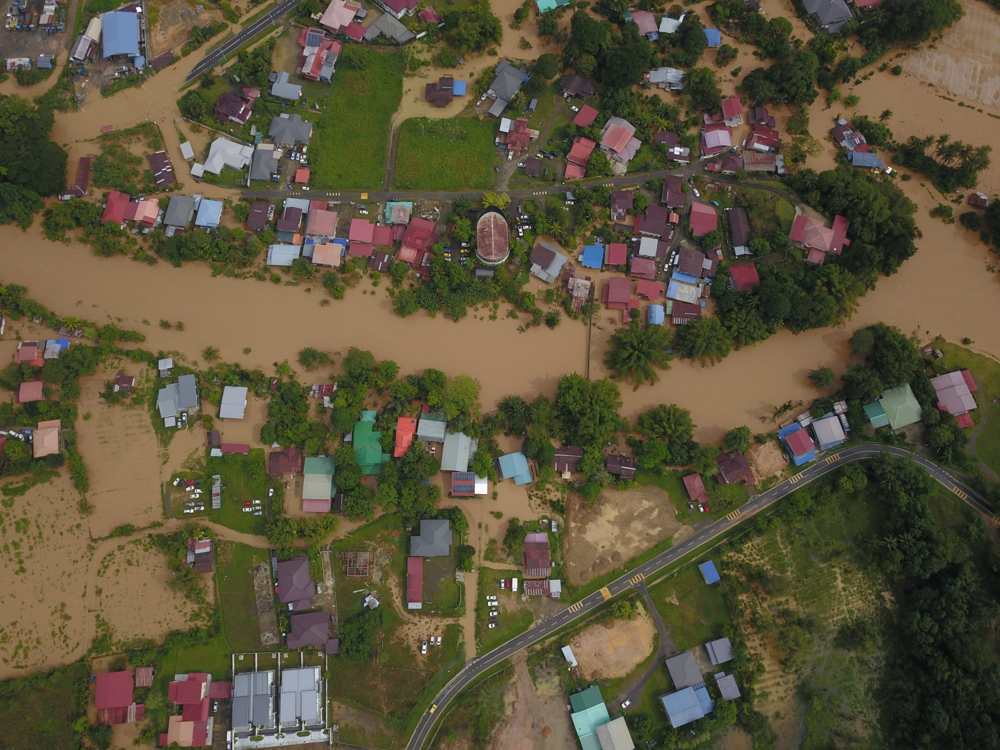

In [13]:
idx = 5
example = dataset["train"][idx]
image = example["image"]
print(np.array(image).shape)
image

In [14]:
# load corresponding ground truth segmentation map, which includes a label per pixel
segmentation_map = np.array(example['label'])
segmentation_map, segmentation_map.shape

(array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]),
 (1500, 2000))

In [15]:
np.unique(segmentation_map)

array([0, 1])

In [16]:
# Define the mapping from pixel values to class labels
id2label = {0: 'other', 1: 'flood'}

In [17]:
# Assign green color to non-flood and red color to flood
palette = np.array([[0, 255, 0], [0, 0, 255]])

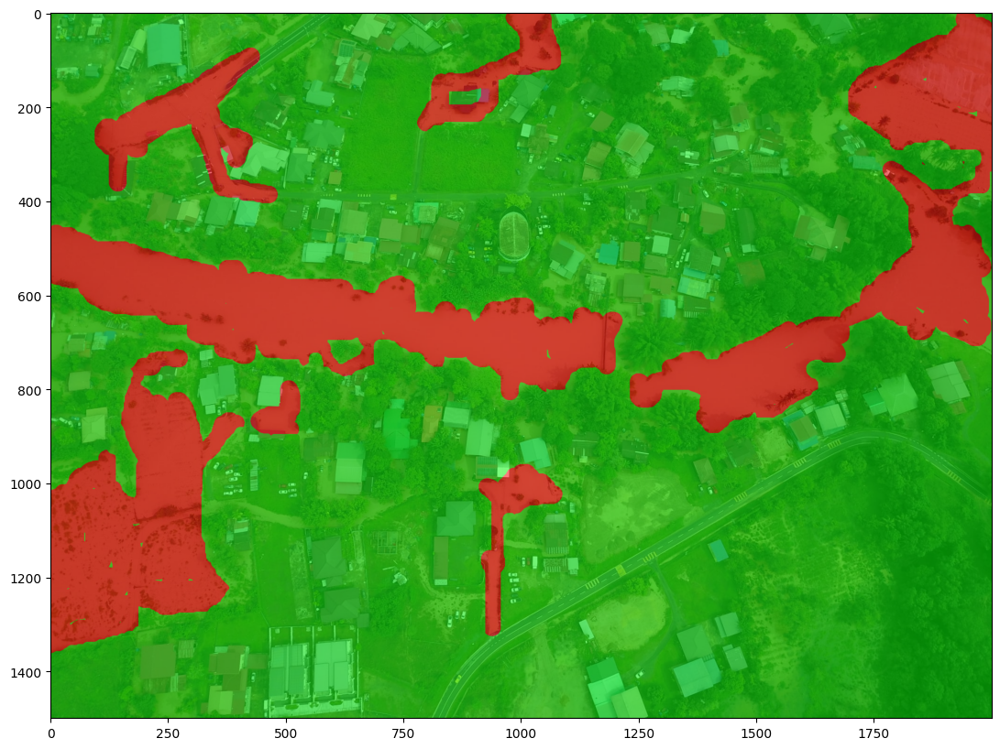

In [18]:
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3

for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

#### Create PyTorch Dataset

In [19]:
class ImageSegmentationDataset(TorchDataset):
    """Image segmentation dataset."""

    def __init__(self, dataset, transform):
        """
        Args:
            dataset
        """
        self.dataset = dataset
        self.transform = transform
        
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        original_image = np.array(self.dataset[idx]['image'])
        original_segmentation_map = np.array(self.dataset[idx]['label'])
        
        transformed = self.transform(image=original_image, mask=original_segmentation_map)
        image, segmentation_map = transformed['image'], transformed['mask']

        # convert to C, H, W
        image = image.transpose(2,0,1)

        return image, segmentation_map, original_image, original_segmentation_map

In [20]:
def compute_stats(dataset):
    """
    Calculate mean and standard deviation of each channel of the images in the dataset
    """
    mean = []
    std = []
    for i in tqdm(range(len(dataset))):
        image = np.array(dataset[i]['image'])
        mean.append([float(image[:, :, i].mean()) for i in range(image.shape[2])])
        std.append([float(image[:, :, i].std()) for i in range(image.shape[2])])
        
    mean = np.array(mean).mean(axis=0)
    std = np.array(std).mean(axis=0)
    return mean, std

mean, std = compute_stats(train_ds)
mean, std


  0%|                                                                                                                                  | 0/200 [00:00<?, ?it/s]


  0%|▌                                                                                                                         | 1/200 [00:00<00:24,  8.11it/s]


  1%|█▏                                                                                                                        | 2/200 [00:00<00:25,  7.67it/s]


  2%|█▊                                                                                                                        | 3/200 [00:00<00:31,  6.29it/s]


  2%|██▍                                                                                                                       | 4/200 [00:00<00:46,  4.19it/s]


  2%|███                                                                                                                       | 5/200 [00:01<00:43,  4.45it/s]


  3%|███▋                                                                                                                      | 6/200 [00:02<01:41,  1.92it/s]


  4%|████▎                                                                                                                     | 7/200 [00:02<01:15,  2.56it/s]


  4%|█████▍                                                                                                                    | 9/200 [00:02<01:00,  3.16it/s]


  5%|██████                                                                                                                   | 10/200 [00:04<01:59,  1.58it/s]


  6%|██████▋                                                                                                                  | 11/200 [00:05<02:14,  1.41it/s]


  6%|███████▎                                                                                                                 | 12/200 [00:06<02:36,  1.20it/s]


  6%|███████▊                                                                                                                 | 13/200 [00:06<02:18,  1.35it/s]


  7%|████████▍                                                                                                                | 14/200 [00:10<04:43,  1.52s/it]


  8%|█████████                                                                                                                | 15/200 [00:10<03:30,  1.14s/it]


  8%|██████████▎                                                                                                              | 17/200 [00:10<02:01,  1.51it/s]


 10%|███████████▍                                                                                                             | 19/200 [00:10<01:18,  2.29it/s]


 10%|████████████▋                                                                                                            | 21/200 [00:11<00:56,  3.19it/s]


 12%|█████████████▉                                                                                                           | 23/200 [00:11<00:40,  4.35it/s]


 12%|███████████████▏                                                                                                         | 25/200 [00:11<00:38,  4.51it/s]


 13%|███████████████▋                                                                                                         | 26/200 [00:11<00:39,  4.38it/s]


 14%|████████████████▎                                                                                                        | 27/200 [00:11<00:34,  4.98it/s]


 14%|████████████████▉                                                                                                        | 28/200 [00:12<00:31,  5.54it/s]


 14%|█████████████████▌                                                                                                       | 29/200 [00:12<00:55,  3.06it/s]


 15%|██████████████████▏                                                                                                      | 30/200 [00:13<00:55,  3.08it/s]


 16%|██████████████████▊                                                                                                      | 31/200 [00:13<00:53,  3.16it/s]


 16%|███████████████████▎                                                                                                     | 32/200 [00:13<00:50,  3.33it/s]


 16%|███████████████████▉                                                                                                     | 33/200 [00:13<00:44,  3.75it/s]


 18%|█████████████████████▏                                                                                                   | 35/200 [00:14<00:30,  5.47it/s]


 18%|█████████████████████▊                                                                                                   | 36/200 [00:15<01:10,  2.32it/s]


 19%|██████████████████████▉                                                                                                  | 38/200 [00:15<00:47,  3.41it/s]


 20%|████████████████████████▏                                                                                                | 40/200 [00:21<03:28,  1.30s/it]


 20%|████████████████████████▊                                                                                                | 41/200 [00:21<02:55,  1.11s/it]


 21%|█████████████████████████▍                                                                                               | 42/200 [00:22<02:22,  1.11it/s]


 22%|██████████████████████████                                                                                               | 43/200 [00:22<01:58,  1.33it/s]


 22%|███████████████████████████▏                                                                                             | 45/200 [00:22<01:13,  2.10it/s]


 23%|███████████████████████████▊                                                                                             | 46/200 [00:22<01:03,  2.44it/s]


 24%|████████████████████████████▍                                                                                            | 47/200 [00:23<01:10,  2.17it/s]


 24%|█████████████████████████████▋                                                                                           | 49/200 [00:23<00:45,  3.28it/s]


 26%|███████████████████████████████▍                                                                                         | 52/200 [00:23<00:27,  5.41it/s]


 27%|████████████████████████████████▋                                                                                        | 54/200 [00:24<00:31,  4.63it/s]


 28%|█████████████████████████████████▉                                                                                       | 56/200 [00:24<00:25,  5.73it/s]


 29%|███████████████████████████████████                                                                                      | 58/200 [00:24<00:20,  7.09it/s]


 30%|████████████████████████████████████▎                                                                                    | 60/200 [00:26<00:46,  3.01it/s]


 31%|█████████████████████████████████████▌                                                                                   | 62/200 [00:26<00:38,  3.58it/s]


 32%|██████████████████████████████████████                                                                                   | 63/200 [00:26<00:34,  3.99it/s]


 32%|███████████████████████████████████████▎                                                                                 | 65/200 [00:29<01:34,  1.43it/s]


 33%|███████████████████████████████████████▉                                                                                 | 66/200 [00:29<01:19,  1.68it/s]


 34%|████████████████████████████████████████▌                                                                                | 67/200 [00:35<03:57,  1.78s/it]


 34%|█████████████████████████████████████████▏                                                                               | 68/200 [00:37<03:59,  1.81s/it]


 34%|█████████████████████████████████████████▋                                                                               | 69/200 [00:39<03:53,  1.78s/it]


 36%|██████████████████████████████████████████▉                                                                              | 71/200 [00:40<02:34,  1.20s/it]


 36%|████████████████████████████████████████████▏                                                                            | 73/200 [00:41<02:03,  1.03it/s]


 37%|████████████████████████████████████████████▊                                                                            | 74/200 [00:41<01:42,  1.23it/s]


 38%|█████████████████████████████████████████████▉                                                                           | 76/200 [00:41<01:06,  1.88it/s]


 38%|██████████████████████████████████████████████▌                                                                          | 77/200 [00:41<00:54,  2.26it/s]


 40%|███████████████████████████████████████████████▊                                                                         | 79/200 [00:42<00:41,  2.88it/s]


 40%|████████████████████████████████████████████████▍                                                                        | 80/200 [00:42<00:49,  2.42it/s]


 40%|█████████████████████████████████████████████████                                                                        | 81/200 [00:43<00:43,  2.74it/s]


 41%|█████████████████████████████████████████████████▌                                                                       | 82/200 [00:43<00:37,  3.11it/s]


 42%|██████████████████████████████████████████████████▏                                                                      | 83/200 [00:43<00:40,  2.90it/s]


 42%|██████████████████████████████████████████████████▊                                                                      | 84/200 [00:43<00:32,  3.54it/s]


 44%|████████████████████████████████████████████████████▋                                                                    | 87/200 [00:46<01:07,  1.68it/s]


 44%|█████████████████████████████████████████████████████▊                                                                   | 89/200 [00:46<00:45,  2.42it/s]


 46%|███████████████████████████████████████████████████████                                                                  | 91/200 [00:46<00:35,  3.07it/s]


 46%|███████████████████████████████████████████████████████▋                                                                 | 92/200 [00:47<00:34,  3.12it/s]


 46%|████████████████████████████████████████████████████████▎                                                                | 93/200 [00:47<00:40,  2.62it/s]


 48%|█████████████████████████████████████████████████████████▍                                                               | 95/200 [00:48<00:40,  2.58it/s]


 48%|██████████████████████████████████████████████████████████                                                               | 96/200 [00:48<00:36,  2.85it/s]


 49%|███████████████████████████████████████████████████████████▎                                                             | 98/200 [00:48<00:24,  4.18it/s]


 50%|███████████████████████████████████████████████████████████▉                                                             | 99/200 [00:49<00:23,  4.30it/s]


 50%|████████████████████████████████████████████████████████████                                                            | 100/200 [00:51<01:10,  1.41it/s]


 50%|████████████████████████████████████████████████████████████▌                                                           | 101/200 [00:51<00:55,  1.78it/s]


 51%|█████████████████████████████████████████████████████████████▏                                                          | 102/200 [00:51<00:47,  2.06it/s]


 52%|██████████████████████████████████████████████████████████████▍                                                         | 104/200 [00:51<00:30,  3.16it/s]


 52%|███████████████████████████████████████████████████████████████                                                         | 105/200 [00:55<01:51,  1.17s/it]


 54%|████████████████████████████████████████████████████████████████▏                                                       | 107/200 [00:56<01:12,  1.29it/s]


 54%|████████████████████████████████████████████████████████████████▊                                                       | 108/200 [00:56<01:02,  1.48it/s]


 55%|█████████████████████████████████████████████████████████████████▍                                                      | 109/200 [00:56<00:50,  1.79it/s]


 55%|██████████████████████████████████████████████████████████████████                                                      | 110/200 [00:57<00:42,  2.14it/s]


 56%|██████████████████████████████████████████████████████████████████▌                                                     | 111/200 [00:57<00:34,  2.56it/s]


 56%|███████████████████████████████████████████████████████████████████▏                                                    | 112/200 [00:57<00:29,  3.03it/s]


 56%|███████████████████████████████████████████████████████████████████▊                                                    | 113/200 [00:57<00:26,  3.34it/s]


 57%|████████████████████████████████████████████████████████████████████▍                                                   | 114/200 [00:57<00:24,  3.56it/s]


 57%|█████████████████████████████████████████████████████████████████████                                                   | 115/200 [00:57<00:19,  4.26it/s]


 58%|█████████████████████████████████████████████████████████████████████▌                                                  | 116/200 [00:58<00:19,  4.40it/s]


 58%|██████████████████████████████████████████████████████████████████████▏                                                 | 117/200 [00:58<00:19,  4.30it/s]


 60%|███████████████████████████████████████████████████████████████████████▍                                                | 119/200 [01:00<00:48,  1.68it/s]


 60%|████████████████████████████████████████████████████████████████████████▌                                               | 121/200 [01:03<01:13,  1.08it/s]


 61%|█████████████████████████████████████████████████████████████████████████▏                                              | 122/200 [01:03<01:00,  1.29it/s]


 62%|██████████████████████████████████████████████████████████████████████████▍                                             | 124/200 [01:03<00:39,  1.93it/s]


 63%|███████████████████████████████████████████████████████████████████████████▌                                            | 126/200 [01:04<00:28,  2.64it/s]


 64%|████████████████████████████████████████████████████████████████████████████▏                                           | 127/200 [01:05<00:37,  1.95it/s]


 64%|████████████████████████████████████████████████████████████████████████████▊                                           | 128/200 [01:05<00:35,  2.04it/s]


 64%|█████████████████████████████████████████████████████████████████████████████▍                                          | 129/200 [01:05<00:29,  2.43it/s]


 65%|██████████████████████████████████████████████████████████████████████████████                                          | 130/200 [01:05<00:24,  2.87it/s]


 66%|██████████████████████████████████████████████████████████████████████████████▌                                         | 131/200 [01:06<00:21,  3.28it/s]


 66%|███████████████████████████████████████████████████████████████████████████████▏                                        | 132/200 [01:06<00:27,  2.48it/s]


 66%|███████████████████████████████████████████████████████████████████████████████▊                                        | 133/200 [01:07<00:25,  2.59it/s]


 67%|████████████████████████████████████████████████████████████████████████████████▍                                       | 134/200 [01:07<00:25,  2.61it/s]


 68%|█████████████████████████████████████████████████████████████████████████████████                                       | 135/200 [01:07<00:22,  2.91it/s]


 68%|█████████████████████████████████████████████████████████████████████████████████▌                                      | 136/200 [01:07<00:18,  3.54it/s]


 68%|██████████████████████████████████████████████████████████████████████████████████▏                                     | 137/200 [01:07<00:15,  3.98it/s]


 69%|██████████████████████████████████████████████████████████████████████████████████▊                                     | 138/200 [01:08<00:16,  3.87it/s]


 70%|███████████████████████████████████████████████████████████████████████████████████▍                                    | 139/200 [01:08<00:13,  4.53it/s]


 70%|████████████████████████████████████████████████████████████████████████████████████                                    | 140/200 [01:08<00:14,  4.08it/s]


 70%|████████████████████████████████████████████████████████████████████████████████████▌                                   | 141/200 [01:08<00:12,  4.67it/s]


 71%|█████████████████████████████████████████████████████████████████████████████████████▏                                  | 142/200 [01:08<00:11,  5.12it/s]


 72%|█████████████████████████████████████████████████████████████████████████████████████▊                                  | 143/200 [01:09<00:09,  5.91it/s]


 72%|██████████████████████████████████████████████████████████████████████████████████████▍                                 | 144/200 [01:09<00:10,  5.14it/s]


 72%|███████████████████████████████████████████████████████████████████████████████████████                                 | 145/200 [01:10<00:24,  2.22it/s]


 74%|████████████████████████████████████████████████████████████████████████████████████████▏                               | 147/200 [01:10<00:16,  3.16it/s]


 74%|████████████████████████████████████████████████████████████████████████████████████████▊                               | 148/200 [01:11<00:16,  3.13it/s]


 74%|█████████████████████████████████████████████████████████████████████████████████████████▍                              | 149/200 [01:11<00:14,  3.61it/s]


 75%|██████████████████████████████████████████████████████████████████████████████████████████                              | 150/200 [01:11<00:11,  4.23it/s]


 76%|███████████████████████████████████████████████████████████████████████████████████████████▏                            | 152/200 [01:11<00:07,  6.15it/s]


 76%|███████████████████████████████████████████████████████████████████████████████████████████▊                            | 153/200 [01:11<00:08,  5.37it/s]


 77%|████████████████████████████████████████████████████████████████████████████████████████████▍                           | 154/200 [01:11<00:08,  5.74it/s]


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▌                          | 156/200 [01:12<00:06,  6.87it/s]


 78%|██████████████████████████████████████████████████████████████████████████████████████████████▏                         | 157/200 [01:13<00:18,  2.27it/s]


 79%|██████████████████████████████████████████████████████████████████████████████████████████████▊                         | 158/200 [01:17<00:52,  1.25s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████▍                        | 159/200 [01:17<00:39,  1.04it/s]


 80%|████████████████████████████████████████████████████████████████████████████████████████████████                        | 160/200 [01:17<00:29,  1.37it/s]


 80%|████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 161/200 [01:17<00:26,  1.46it/s]


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 163/200 [01:19<00:25,  1.43it/s]


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 164/200 [01:19<00:20,  1.76it/s]


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 166/200 [01:19<00:12,  2.67it/s]


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 167/200 [01:19<00:10,  3.14it/s]


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 169/200 [01:20<00:08,  3.66it/s]


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████                  | 170/200 [01:26<00:49,  1.66s/it]


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 171/200 [01:27<00:38,  1.33s/it]


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 173/200 [01:27<00:22,  1.22it/s]


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 174/200 [01:27<00:17,  1.49it/s]


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████               | 175/200 [01:30<00:29,  1.17s/it]


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 177/200 [01:30<00:17,  1.28it/s]


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 178/200 [01:30<00:14,  1.53it/s]


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 180/200 [01:31<00:11,  1.77it/s]


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 182/200 [01:31<00:06,  2.59it/s]


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 183/200 [01:32<00:05,  2.88it/s]


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 184/200 [01:32<00:05,  2.93it/s]


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 186/200 [01:32<00:03,  3.58it/s]


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 187/200 [01:33<00:05,  2.41it/s]


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 188/200 [01:33<00:04,  2.89it/s]


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 190/200 [01:34<00:02,  3.59it/s]


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 191/200 [01:34<00:02,  3.66it/s]


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 192/200 [01:34<00:01,  4.18it/s]


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 194/200 [01:34<00:01,  5.70it/s]


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 195/200 [01:35<00:01,  2.74it/s]


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 196/200 [01:35<00:01,  3.01it/s]


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 197/200 [01:36<00:00,  3.46it/s]


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 198/200 [01:36<00:00,  3.24it/s]


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 199/200 [01:37<00:00,  1.99it/s]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [01:37<00:00,  2.05it/s]

(array([127.61284707, 126.67704506, 114.08192164]),
 array([55.01579928, 49.45631369, 53.15144932]))

Apply transformations to the dataset.

In [21]:
FLOOD_MEAN = mean / 255
FLOOD_STD = std / 255

H = 512
W = 512

train_transform = A.Compose([
    # A.LongestMaxSize(max_size=5000),
    A.Resize(width=768, height=768),
    A.RandomCrop(width=W, height=H),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=tuple(FLOOD_MEAN), std=tuple(FLOOD_STD)),
])

test_transform = A.Compose([
    A.Resize(width=W, height=H),
    A.Normalize(mean=tuple(FLOOD_MEAN), std=tuple(FLOOD_STD)),
])

train_dataset = ImageSegmentationDataset(train_ds, transform=train_transform)
val_dataset = ImageSegmentationDataset(val_ds, transform=test_transform)
test_dataset = ImageSegmentationDataset(test_ds, transform=test_transform)

#### Verify the transformations by unrolling them

In [22]:
image, segmentation_map, _, _ = train_dataset[5]
print(image.shape)
print(segmentation_map.shape)

(3, 512, 512)
(512, 512)


In [23]:
image.min(), image.max(), segmentation_map.min(), segmentation_map.max()

(np.float32(-2.359194), np.float32(2.6512556), np.int32(0), np.int32(1))

Check that data augmentations work well

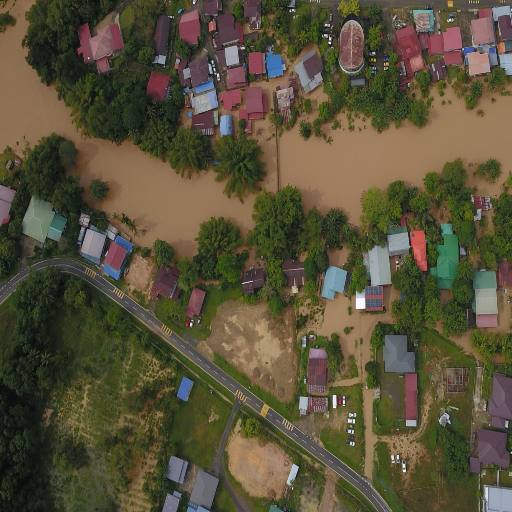

In [24]:
unnormalized_image = (image * np.array(FLOOD_STD)[:, None, None]) + np.array(FLOOD_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

Check that map is correct

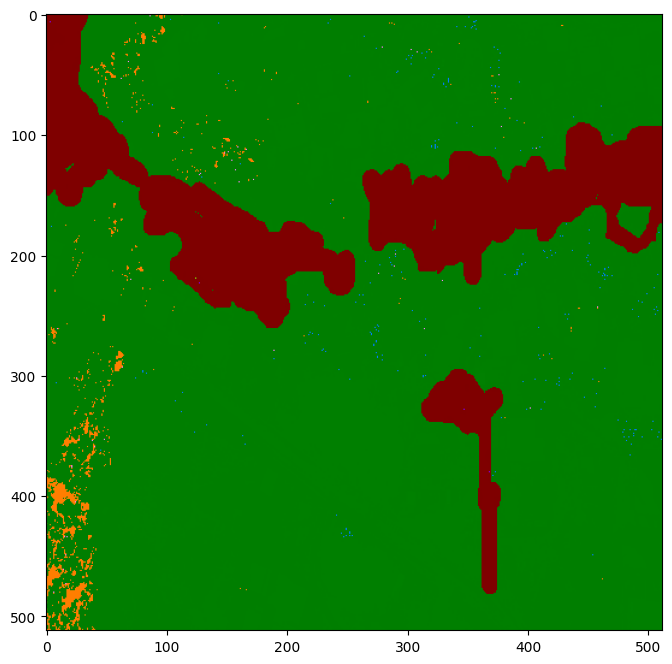

In [25]:
color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.moveaxis(image, 0, -1) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(12, 8))
plt.imshow(img)
plt.show()

#### Create PyTorch DataLoaders

In [26]:
from transformers import MaskFormerImageProcessor

# Create a preprocessor
# preprocessor = MaskFormerImageProcessor(ignore_index=0, reduce_labels=False,
#                                         do_resize=False, do_rescale=False, do_normalize=False)
preprocessor = MaskFormerImageProcessor(ignore_index=-1,reduce_labels=False, do_resize=False,
                                        do_rescale=False, do_normalize=False, num_labels=2)

In [27]:
BATCH_SIZE = 4

In [28]:
def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    segmentation_maps = inputs[1]
    # this function pads the inputs to the same size,
    # and creates a pixel mask
    # actually padding isn't required here since we are cropping
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )

    batch["original_images"] = inputs[2]
    batch["original_segmentation_maps"] = inputs[3]
    
    return batch

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn)

#### Final verification of data

In [29]:
batch = next(iter(train_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,v[0].shape)

pixel_values torch.Size([4, 3, 512, 512])
pixel_mask torch.Size([4, 512, 512])
mask_labels torch.Size([2, 512, 512])
class_labels torch.Size([2])
original_images (244, 330, 3)
original_segmentation_maps (244, 330)


In [30]:
pixel_values = batch["pixel_values"][0].numpy()
pixel_values.shape

(3, 512, 512)

Again, let's denormalize an image

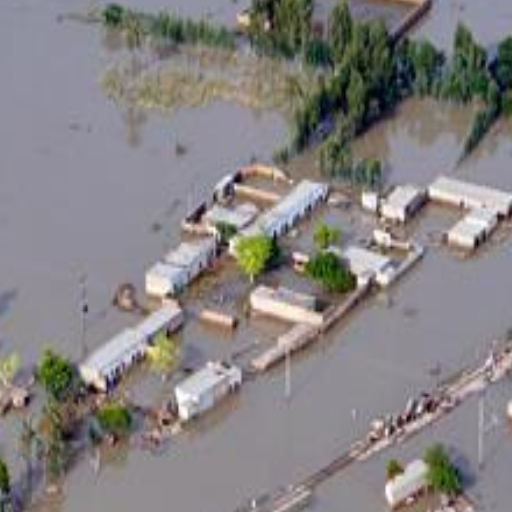

In [31]:
unnormalized_image = (pixel_values * np.array(FLOOD_STD)[:, None, None]) + np.array(FLOOD_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

Let's verify the corresponding binary masks + class labels

In [32]:
batch["class_labels"][0].tolist()

[0, 1]

In [33]:
labels = [id2label[label] for label in batch["class_labels"][0].tolist()]
print(labels)

['other', 'flood']


In [34]:
def visualize_mask(labels, label_name):
  """
  Visualize the mask for a specific label
  """
  print("Label:", label_name)
  idx = labels.index(label_name)

  visual_mask = (batch["mask_labels"][0][idx].bool().numpy() * 255).astype(np.uint8)
  return Image.fromarray(visual_mask)

Label: flood


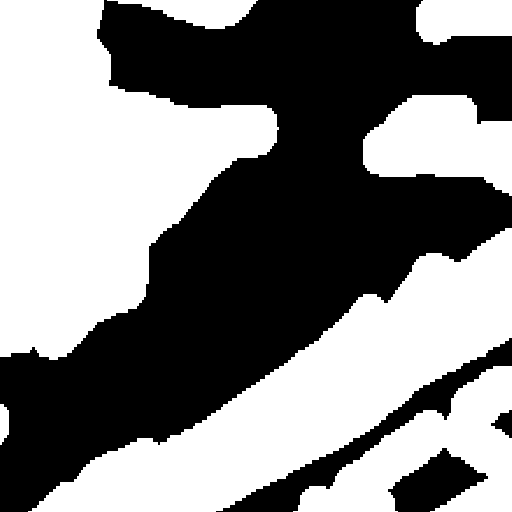

In [35]:
visualize_mask(labels, "flood")

### Define Model
Ignore mismatches keys to replace the already fine-tuned classification head

In [36]:
from transformers import MaskFormerForInstanceSegmentation

# Replace the head of the pre-trained model
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-base-ade",
                                                          id2label=id2label,
                                                          ignore_mismatched_sizes=True)

print("Done loading model")

Some weights of MaskFormerForInstanceSegmentation were not initialized from the model checkpoint at facebook/maskformer-swin-base-ade and are newly initialized because the shapes did not match:
- class_predictor.weight: found shape torch.Size([151, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- class_predictor.bias: found shape torch.Size([151]) in the checkpoint and torch.Size([3]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([151]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Done loading model


In [37]:
## Initial loss
outputs = model(batch["pixel_values"],
                class_labels=batch["class_labels"],
                mask_labels=batch["mask_labels"])
init_loss = outputs.loss.item()
init_loss

3.222545623779297

#### Qualitative performance of pre-trained model

In [38]:
def draw_true_predicted_segmentation(image, predicted_segmentation_map, ground_truth_segmentation_map):
    # Use a subplot
    fig, ax = plt.subplots(1, 3, figsize=(15, 8))
    ax[0].imshow(image)
    ax[0].set_title("Image")
    ax[0].axis("off")

    # Draw the predicted segmentation map on the image
    pred_color_seg_map = np.zeros((predicted_segmentation_map.shape[0], predicted_segmentation_map.shape[1], 3), dtype=np.uint8)
    # Check if predicted_segmentation_map is on the GPU
    if predicted_segmentation_map.is_cuda:
        predicted_segmentation_map_cpu = predicted_segmentation_map.cpu().numpy()
    else:
        predicted_segmentation_map_cpu = predicted_segmentation_map.numpy()
    for label, color in enumerate(palette):
        pred_color_seg_map[predicted_segmentation_map_cpu == label, :] = color
    pred_color_seg = pred_color_seg_map[..., ::-1]
    pred = image * 0.5 + pred_color_seg * 0.5
    pred = pred.astype(np.uint8)
    ax[1].imshow(pred)
    ax[1].set_title("Predicted Segmentation")
    ax[1].axis("off")

    # Draw the ground truth segmentation map on the image
    gt_color_seg_map = np.zeros((ground_truth_segmentation_map.shape[0], ground_truth_segmentation_map.shape[1], 3), dtype=np.uint8)
    for label, color in enumerate(palette):
        gt_color_seg_map[ground_truth_segmentation_map == label, :] = color
    gt_color_seg = gt_color_seg_map[..., ::-1]
    gt = image * 0.5 + gt_color_seg * 0.5
    gt = gt.astype(np.uint8)
    ax[2].imshow(gt)
    ax[2].set_title("Ground Truth Segmentation")
    ax[2].axis("off")

    plt.show()

In [39]:
# Choose a batch from test data
batch = next(iter(test_dataloader))
# batch = next(iter(val_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))

pixel_values torch.Size([4, 3, 512, 512])
pixel_mask torch.Size([4, 512, 512])
mask_labels 4
class_labels 4
original_images 4
original_segmentation_maps 4


In [40]:
with torch.no_grad():
  outputs = model(batch["pixel_values"])
  
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)
ground_truth_segmentation_maps = batch["original_segmentation_maps"]

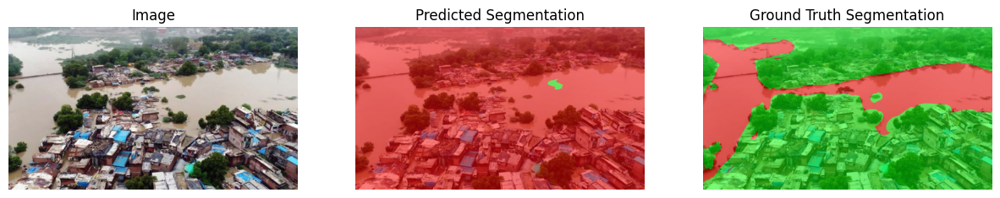

In [41]:
idx = 0
draw_true_predicted_segmentation(batch["original_images"][idx], predicted_segmentation_maps[idx],
                                 ground_truth_segmentation_maps[idx])

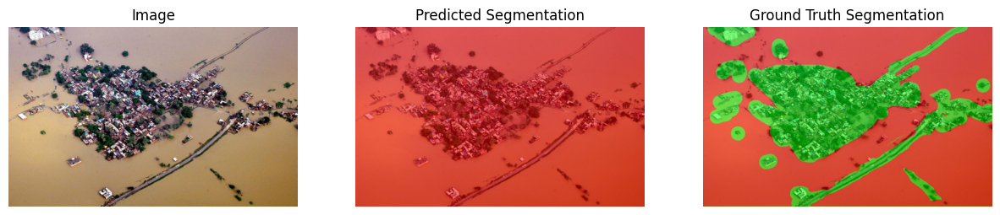

In [42]:
idx = 3
draw_true_predicted_segmentation(batch["original_images"][idx], predicted_segmentation_maps[idx],
                                 ground_truth_segmentation_maps[idx])

#### Load the model on device

In [43]:
# Load the model on the GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print("Loaded model to device")

Loaded model to device


**Note:** Evaluation metric used is Mean Intersection over Union (mIoU) from `evaluate` library.

In [44]:
import evaluate

metric = evaluate.load("mean_iou")

In [45]:
def evaluate_iou(model, dataloader, metric: evaluate.EvaluationModule):
  model.eval()
  for _, batch in enumerate(tqdm(dataloader)):

    pixel_values = batch["pixel_values"]
    
    # Forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values.to(device))

    # NOTE: Original images are used to evaluate the model
    original_images = batch["original_images"]
    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                  target_sizes=target_sizes)

    # get ground truth segmentation maps
    ground_truth_segmentation_maps = batch["original_segmentation_maps"]

    # print("Prediction:")
    # print(predicted_segmentation_maps)
    # print("Ground Truth:")
    # print(ground_truth_segmentation_maps)

    metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)
  
  mean_iou = metric.compute(num_labels = len(id2label), ignore_index = -1)
  # NOTE this metric outputs a dict that also includes the mIoU per category as keys
  print("Mean IoU:", mean_iou['mean_iou'])
  return mean_iou

#### Evaluate the pre-trained model

In [46]:
init_eval_miou = evaluate_iou(model, val_dataloader, metric)
init_eval_miou


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]

/export/home/co21btech11001/.conda/envs/nlp_env/lib/python3.10/site-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")

 20%|████████████████████████▊                                                                                                   | 1/5 [00:04<00:19,  4.98s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:08<00:12,  4.04s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:09<00:05,  2.78s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:31<00:10, 10.18s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:43<00:00, 11.06s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:43<00:00,  8.76s/it]

Mean IoU: 0.21554542507987742


{'mean_iou': np.float64(0.21554542507987742),
 'mean_accuracy': np.float64(0.398571840364206),
 'overall_accuracy': np.float64(0.42154888109708877),
 'per_category_iou': array([0.01451139, 0.41657946]),
 'per_category_accuracy': array([0.01813047, 0.77901321])}

**21.5%** mIoU on the validation set

#### Fine-tune the model on the flood area segmentation dataset

In [47]:
NUM_EPOCHS = 10

In [48]:
losses = [init_loss / BATCH_SIZE]
miou = [init_eval_miou['mean_iou']]

In [49]:
optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

running_loss = 0.0
num_samples = 0
for epoch in range(NUM_EPOCHS):
  print("Epoch:", epoch + 1)
  model.train()
  for idx, batch in enumerate(tqdm(train_dataloader)):
      # Reset the parameter gradients
      optimizer.zero_grad()

      # Forward pass
      outputs = model(
          pixel_values=batch["pixel_values"].to(device),
          mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
          class_labels=[labels.to(device) for labels in batch["class_labels"]],
      )

      # Backward propagation
      loss = outputs.loss
      loss.backward()

      batch_size = batch["pixel_values"].size(0)
      running_loss += loss.item()
      num_samples += batch_size

      if idx % 10 == 0:
        losses.append(running_loss/num_samples)
        print("Loss:", running_loss/num_samples)

      # Optimization
      optimizer.step()

  # Evaluate the model
  temp_miou = evaluate_iou(model, val_dataloader, metric)
  miou.append(temp_miou['mean_iou'])

Epoch: 1



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]

Loss: 0.7132720947265625



  2%|██▍                                                                                                                        | 1/50 [00:04<04:04,  4.99s/it]


  4%|████▉                                                                                                                      | 2/50 [00:11<04:41,  5.87s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:16<04:19,  5.52s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:20<03:44,  4.88s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:34<06:03,  8.08s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:37<04:36,  6.29s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:39<03:32,  4.94s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:43<03:21,  4.79s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:47<02:58,  4.34s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:49<02:30,  3.75s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:55<02:50,  4.36s/it]

Loss: 0.45614308389750396



 24%|█████████████████████████████▎                                                                                            | 12/50 [00:57<02:18,  3.64s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:02<02:35,  4.20s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:04<02:05,  3.49s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:06<01:47,  3.07s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:08<01:32,  2.71s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:15<02:15,  4.09s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:34<04:34,  8.58s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:42<04:18,  8.34s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:56<04:57,  9.91s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:59<03:48,  7.89s/it]

Loss: 0.40408907050178167



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [02:06<03:31,  7.57s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [02:08<02:41,  5.97s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [02:10<02:08,  4.95s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [02:12<01:40,  4.01s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [02:17<01:42,  4.26s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [02:27<02:13,  5.79s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [02:28<01:39,  4.53s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [02:31<01:27,  4.19s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:34<01:11,  3.57s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:37<01:09,  3.66s/it]

Loss: 0.36534889378855306



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:52<02:05,  6.95s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:57<01:49,  6.42s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [03:04<01:43,  6.50s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [03:07<01:23,  5.53s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [03:09<01:03,  4.53s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [03:11<00:47,  3.68s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [03:15<00:44,  3.68s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [03:20<00:44,  4.03s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [03:21<00:33,  3.31s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:31<00:46,  5.17s/it]

Loss: 0.34227289332122335



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:33<00:34,  4.31s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:35<00:24,  3.49s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:37<00:18,  3.03s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:40<00:15,  3.17s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:42<00:11,  2.93s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:44<00:07,  2.62s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:46<00:04,  2.33s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:48<00:02,  2.25s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:50<00:00,  2.11s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:50<00:00,  4.61s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:02<00:08,  2.18s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:05<00:07,  2.63s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:06<00:04,  2.01s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:20<00:06,  6.72s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:32<00:00,  8.79s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:32<00:00,  6.56s/it]

Mean IoU: 0.8155795921307967
Epoch: 2



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:14<11:56, 14.61s/it]

Loss: 0.319096879047506



  4%|████▉                                                                                                                      | 2/50 [00:18<06:34,  8.22s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:20<04:11,  5.35s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:21<02:57,  3.86s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:24<02:25,  3.24s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:28<02:47,  3.81s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:33<02:48,  3.91s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:35<02:23,  3.42s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:36<01:56,  2.84s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:46<03:11,  4.79s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:53<03:38,  5.61s/it]

Loss: 0.3034047064233999



 24%|█████████████████████████████▎                                                                                            | 12/50 [01:00<03:49,  6.05s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:04<03:23,  5.51s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:19<04:58,  8.29s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:21<03:43,  6.38s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:22<02:45,  4.87s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:28<02:49,  5.12s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:33<02:43,  5.11s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:39<02:46,  5.36s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:53<04:00,  8.01s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [02:01<03:44,  7.75s/it]

Loss: 0.28605992945147235



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [02:04<03:01,  6.48s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [02:05<02:13,  4.94s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [02:07<01:40,  3.86s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [02:13<01:54,  4.60s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [02:15<01:27,  3.66s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [02:17<01:12,  3.16s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [02:18<00:57,  2.59s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [02:27<01:33,  4.47s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:34<01:44,  5.25s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:36<01:21,  4.27s/it]

Loss: 0.2738556764376016



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:38<01:03,  3.54s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:46<01:24,  4.96s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:48<01:04,  4.00s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:50<00:51,  3.44s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:52<00:42,  3.01s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:58<00:51,  3.93s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [03:13<01:29,  7.44s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [03:16<01:04,  5.85s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [03:17<00:46,  4.65s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:19<00:34,  3.88s/it]

Loss: 0.2605091826273845



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:22<00:27,  3.45s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:24<00:21,  3.12s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:26<00:16,  2.80s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:30<00:14,  2.92s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:32<00:10,  2.75s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:34<00:07,  2.56s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:36<00:04,  2.34s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:45<00:04,  4.46s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:48<00:00,  3.93s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:48<00:00,  4.57s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.14s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.26s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.79s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.35s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  8.38s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.15s/it]

Mean IoU: 0.8837804048021991
Epoch: 3



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:04<03:34,  4.38s/it]

Loss: 0.2543942257024274



  4%|████▉                                                                                                                      | 2/50 [00:06<02:12,  2.77s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:07<01:52,  2.39s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:11<02:12,  2.88s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:13<01:54,  2.54s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:20<02:51,  3.91s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:30<04:23,  6.14s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:32<03:17,  4.71s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:40<03:56,  5.76s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:44<03:28,  5.22s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:46<02:41,  4.15s/it]

Loss: 0.24730586435075277



 24%|█████████████████████████████▎                                                                                            | 12/50 [00:48<02:20,  3.70s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:04<04:31,  7.35s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:13<04:42,  7.84s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:17<03:47,  6.50s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:25<04:04,  7.19s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:27<03:05,  5.61s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:29<02:24,  4.52s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:32<02:04,  4.02s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:33<01:36,  3.21s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:36<01:23,  2.89s/it]

Loss: 0.24103256635183146



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:45<02:15,  4.85s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:47<01:47,  4.00s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:50<01:36,  3.72s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:55<01:43,  4.13s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:58<01:32,  3.85s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [02:00<01:15,  3.28s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [02:02<01:03,  2.91s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [02:06<01:05,  3.11s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:07<00:52,  2.61s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:17<01:27,  4.61s/it]

Loss: 0.2350418015404512



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:36<02:41,  8.98s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:39<02:03,  7.26s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:41<01:30,  5.67s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:44<01:11,  4.78s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:49<01:08,  4.90s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:53<01:01,  4.74s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:58<00:54,  4.58s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [03:00<00:41,  3.80s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [03:02<00:34,  3.42s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:08<00:36,  4.07s/it]

Loss: 0.2319151222811523



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:15<00:39,  5.00s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:20<00:34,  4.92s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:21<00:23,  4.00s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:23<00:17,  3.43s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:25<00:11,  2.83s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:28<00:08,  2.82s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:32<00:06,  3.31s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:46<00:06,  6.33s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:48<00:00,  5.27s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:48<00:00,  4.58s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.18s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.26s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.80s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.22s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  8.26s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.06s/it]

Mean IoU: 0.884430838341628
Epoch: 4



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:09<08:07,  9.96s/it]

Loss: 0.2262108721184415



  4%|████▉                                                                                                                      | 2/50 [00:12<04:15,  5.32s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:15<03:20,  4.26s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:29<06:29,  8.47s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:35<05:38,  7.52s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:37<04:04,  5.56s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:51<05:51,  8.17s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:55<04:59,  7.13s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:59<04:02,  5.90s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [01:01<03:10,  4.77s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [01:03<02:30,  3.85s/it]

Loss: 0.22120332532787915



 24%|█████████████████████████████▎                                                                                            | 12/50 [01:05<02:03,  3.26s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:06<01:42,  2.77s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:08<01:28,  2.46s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:10<01:24,  2.42s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:14<01:39,  2.94s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:17<01:28,  2.69s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:20<01:32,  2.89s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:24<01:41,  3.27s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:26<01:22,  2.74s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:37<02:35,  5.36s/it]

Loss: 0.21977955826193268



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:44<02:47,  5.97s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:49<02:26,  5.43s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:50<01:52,  4.31s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:55<01:48,  4.33s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:58<01:34,  3.92s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [02:03<01:42,  4.46s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [02:07<01:32,  4.20s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [02:12<01:32,  4.40s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:14<01:14,  3.74s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:17<01:05,  3.44s/it]

Loss: 0.21565283019898346



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:19<00:54,  3.04s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:20<00:43,  2.58s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:24<00:46,  2.93s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:27<00:43,  2.87s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:34<00:58,  4.19s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:41<01:03,  4.89s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:43<00:51,  4.26s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [02:53<01:04,  5.88s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [03:02<01:06,  6.68s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:04<00:47,  5.26s/it]

Loss: 0.21263386777246185



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:05<00:32,  4.10s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:07<00:24,  3.47s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:13<00:26,  4.34s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:18<00:21,  4.36s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:37<00:34,  8.67s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:38<00:19,  6.47s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:41<00:10,  5.37s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:46<00:05,  5.29s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.17s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.56s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.18s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.30s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.85s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.26s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  8.31s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.11s/it]

Mean IoU: 0.8886810650881438
Epoch: 5



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:01<01:23,  1.69s/it]

Loss: 0.21022577880330345



  4%|████▉                                                                                                                      | 2/50 [00:05<02:28,  3.10s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:08<02:25,  3.09s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:14<03:03,  3.99s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:37<08:18, 11.07s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:41<06:18,  8.61s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:43<04:41,  6.54s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:45<03:28,  4.97s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:52<03:54,  5.72s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [01:02<04:38,  6.97s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [01:04<03:34,  5.49s/it]

Loss: 0.20690521181194704



 24%|█████████████████████████████▎                                                                                            | 12/50 [01:07<02:53,  4.58s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:12<02:54,  4.73s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:16<02:46,  4.61s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:18<02:12,  3.78s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:31<03:46,  6.66s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:34<02:57,  5.37s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:36<02:17,  4.29s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:46<03:05,  5.97s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:48<02:31,  5.06s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:53<02:24,  4.99s/it]

Loss: 0.2047520347310407



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:55<01:50,  3.94s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:58<01:40,  3.72s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [02:04<01:56,  4.48s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [02:07<01:42,  4.10s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [02:09<01:22,  3.42s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [02:17<01:51,  4.84s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [02:24<02:00,  5.46s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [02:28<01:40,  4.81s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:29<01:14,  3.71s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:32<01:09,  3.66s/it]

Loss: 0.20215336307560727



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:34<00:56,  3.12s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:41<01:11,  4.21s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:43<00:58,  3.64s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:50<01:09,  4.63s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:53<00:59,  4.24s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:56<00:49,  3.82s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:58<00:37,  3.11s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [03:00<00:29,  2.69s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [03:03<00:30,  3.05s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:08<00:31,  3.47s/it]

Loss: 0.19937380907199195



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:23<00:55,  6.90s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:24<00:37,  5.34s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:26<00:25,  4.28s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:31<00:22,  4.54s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:34<00:15,  3.84s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:38<00:11,  3.99s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:42<00:07,  3.88s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:44<00:03,  3.37s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  3.45s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.56s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.12s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.26s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.80s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:19<00:06,  6.51s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:31<00:00,  8.54s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:31<00:00,  6.26s/it]

Mean IoU: 0.888027590625307
Epoch: 6



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:04<03:25,  4.20s/it]

Loss: 0.19765511264957755



  4%|████▉                                                                                                                      | 2/50 [00:06<02:40,  3.34s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:08<02:06,  2.69s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:10<01:41,  2.20s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:13<01:49,  2.43s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:15<01:52,  2.56s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:18<01:44,  2.44s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:22<02:07,  3.04s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:24<01:53,  2.78s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:32<02:56,  4.41s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:46<04:42,  7.26s/it]

Loss: 0.19538122658186033



 24%|█████████████████████████████▎                                                                                            | 12/50 [00:50<04:00,  6.32s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [00:54<03:21,  5.45s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [00:55<02:35,  4.32s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:00<02:38,  4.53s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:03<02:10,  3.84s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:04<01:46,  3.21s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:06<01:31,  2.86s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:09<01:26,  2.79s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:16<02:06,  4.21s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:18<01:38,  3.38s/it]

Loss: 0.19387340344956



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:20<01:23,  2.98s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:24<01:30,  3.36s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:26<01:18,  3.01s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:34<01:52,  4.50s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:38<01:43,  4.31s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [01:44<01:45,  4.59s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [01:48<01:42,  4.66s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [01:53<01:36,  4.60s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:12<02:59,  8.99s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:18<02:33,  8.11s/it]

Loss: 0.19192877252755217



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:21<01:57,  6.52s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:23<01:30,  5.30s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:26<01:11,  4.49s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:27<00:53,  3.58s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:30<00:47,  3.41s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:32<00:36,  2.83s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:34<00:29,  2.49s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [02:40<00:38,  3.53s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [02:42<00:31,  3.15s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [02:54<00:53,  5.97s/it]

Loss: 0.19090939666499795



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [02:56<00:37,  4.71s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:14<01:00,  8.66s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:16<00:40,  6.69s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:18<00:25,  5.20s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:24<00:21,  5.42s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:25<00:12,  4.28s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:27<00:06,  3.48s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:36<00:04,  4.99s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  7.06s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.56s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.12s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.19s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.85s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.23s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  8.27s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.07s/it]

Mean IoU: 0.8865496379509634
Epoch: 7



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:06<05:26,  6.66s/it]

Loss: 0.19016337241247247



  4%|████▉                                                                                                                      | 2/50 [00:13<05:20,  6.67s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:15<03:38,  4.65s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:19<03:16,  4.27s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:26<03:53,  5.20s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:27<02:53,  3.94s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:29<02:22,  3.31s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:31<01:54,  2.73s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:33<01:48,  2.64s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:43<03:11,  4.80s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:50<03:33,  5.46s/it]

Loss: 0.18892449181275353



 24%|█████████████████████████████▎                                                                                            | 12/50 [00:52<02:55,  4.61s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [00:54<02:21,  3.83s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [00:57<02:03,  3.44s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:12<04:02,  6.92s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:15<03:20,  5.90s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:19<02:48,  5.10s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:21<02:12,  4.13s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:25<02:09,  4.19s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:27<01:47,  3.57s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:36<02:33,  5.29s/it]

Loss: 0.18702729591792247



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:38<01:58,  4.23s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:40<01:34,  3.50s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:41<01:14,  2.88s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:43<01:04,  2.60s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:45<00:54,  2.28s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [01:46<00:48,  2.10s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [01:49<00:46,  2.13s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [01:52<00:55,  2.65s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [01:54<00:46,  2.34s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [01:56<00:40,  2.12s/it]

Loss: 0.1858832635368105



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:05<01:19,  4.39s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:09<01:10,  4.13s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:12<01:00,  3.77s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:16<01:00,  4.00s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:26<01:18,  5.59s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:41<01:50,  8.46s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:50<01:42,  8.53s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [02:55<01:24,  7.72s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [02:58<01:00,  6.06s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [02:59<00:43,  4.80s/it]

Loss: 0.1843757401070287



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:01<00:31,  3.94s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:05<00:26,  3.80s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:18<00:39,  6.66s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:21<00:27,  5.50s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:23<00:18,  4.59s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:27<00:12,  4.26s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:32<00:09,  4.54s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:36<00:04,  4.22s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  6.28s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.54s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.15s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.27s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.92s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.34s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  8.45s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.20s/it]

Mean IoU: 0.8893975793829673
Epoch: 8



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:01<01:34,  1.93s/it]

Loss: 0.1833571214918737



  4%|████▉                                                                                                                      | 2/50 [00:11<04:59,  6.24s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:14<03:59,  5.11s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:16<02:48,  3.67s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:18<02:14,  2.98s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:20<02:08,  2.92s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:25<02:30,  3.50s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:35<03:52,  5.54s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:37<02:55,  4.28s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:38<02:18,  3.45s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:40<01:56,  2.98s/it]

Loss: 0.18235524015248317



 24%|█████████████████████████████▎                                                                                            | 12/50 [00:43<01:52,  2.96s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [00:47<02:06,  3.41s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [00:50<01:51,  3.10s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [00:52<01:38,  2.83s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [00:55<01:36,  2.83s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [00:57<01:25,  2.59s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:00<01:26,  2.71s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:02<01:19,  2.55s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:04<01:13,  2.45s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:10<01:41,  3.50s/it]

Loss: 0.18135449818443417



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:27<03:32,  7.60s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:29<02:40,  5.93s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:33<02:15,  5.20s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:38<02:05,  5.02s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:39<01:36,  4.02s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [01:43<01:27,  3.82s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [01:49<01:40,  4.57s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [01:56<01:51,  5.31s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [01:58<01:27,  4.37s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:07<01:47,  5.64s/it]

Loss: 0.17980769861323315



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:12<01:42,  5.69s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:18<01:33,  5.49s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:20<01:11,  4.45s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:33<01:49,  7.29s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:44<01:53,  8.13s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:46<01:23,  6.44s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:48<01:02,  5.20s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [02:50<00:46,  4.22s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [02:58<00:53,  5.40s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:06<00:53,  5.91s/it]

Loss: 0.17817495574655434



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:08<00:39,  4.98s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:13<00:34,  4.98s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:15<00:24,  4.04s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:18<00:18,  3.61s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:19<00:11,  2.93s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:21<00:07,  2.59s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:36<00:12,  6.28s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:39<00:05,  5.41s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:46<00:00,  5.80s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:46<00:00,  4.53s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.13s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.18s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.86s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.19s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  8.13s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.98s/it]

Mean IoU: 0.8866799666692102
Epoch: 9



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:03<03:14,  3.98s/it]

Loss: 0.17696635649908807



  4%|████▉                                                                                                                      | 2/50 [00:14<06:18,  7.88s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:16<04:01,  5.14s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:18<03:05,  4.03s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:31<05:16,  7.02s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:33<03:55,  5.35s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:35<03:03,  4.28s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:38<02:48,  4.02s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:44<03:05,  4.51s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:58<05:04,  7.61s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [01:00<03:48,  5.87s/it]

Loss: 0.1755449153174739



 24%|█████████████████████████████▎                                                                                            | 12/50 [01:04<03:16,  5.16s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:11<03:37,  5.87s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:13<02:50,  4.74s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:15<02:12,  3.78s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:17<01:46,  3.14s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:19<01:31,  2.76s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:21<01:22,  2.56s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:23<01:20,  2.59s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:25<01:07,  2.26s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:27<01:02,  2.15s/it]

Loss: 0.17421148839515066



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:29<01:00,  2.16s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:30<00:52,  1.95s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:34<01:02,  2.41s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:36<00:56,  2.28s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:39<01:02,  2.59s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [01:40<00:51,  2.23s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [01:50<01:38,  4.48s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [01:52<01:19,  3.81s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:05<02:11,  6.56s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:12<02:05,  6.59s/it]

Loss: 0.17302206946912885



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:14<01:34,  5.24s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:16<01:11,  4.18s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:20<01:08,  4.25s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:22<00:53,  3.58s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:26<00:49,  3.51s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:28<00:39,  3.06s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:42<01:15,  6.30s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [02:43<00:54,  4.94s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [02:45<00:39,  3.95s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:01<01:06,  7.44s/it]

Loss: 0.17240362653251137



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:03<00:47,  5.88s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:19<01:03,  9.06s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:26<00:50,  8.41s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:33<00:40,  8.09s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:36<00:26,  6.52s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:38<00:15,  5.01s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:40<00:08,  4.02s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:42<00:03,  3.51s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  3.91s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.54s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.13s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.31s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.85s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.24s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  8.28s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.09s/it]

Mean IoU: 0.8914968549017148
Epoch: 10



  0%|                                                                                                                                   | 0/50 [00:00<?, ?it/s]


  2%|██▍                                                                                                                        | 1/50 [00:01<01:29,  1.82s/it]

Loss: 0.17135345195719515



  4%|████▉                                                                                                                      | 2/50 [00:03<01:33,  1.96s/it]


  6%|███████▍                                                                                                                   | 3/50 [00:06<01:45,  2.25s/it]


  8%|█████████▊                                                                                                                 | 4/50 [00:08<01:46,  2.31s/it]


 10%|████████████▎                                                                                                              | 5/50 [00:24<05:21,  7.15s/it]


 12%|██████████████▊                                                                                                            | 6/50 [00:26<03:57,  5.39s/it]


 14%|█████████████████▏                                                                                                         | 7/50 [00:36<04:53,  6.82s/it]


 16%|███████████████████▋                                                                                                       | 8/50 [00:38<03:40,  5.24s/it]


 18%|██████████████████████▏                                                                                                    | 9/50 [00:40<02:59,  4.38s/it]


 20%|████████████████████████▍                                                                                                 | 10/50 [00:47<03:29,  5.23s/it]


 22%|██████████████████████████▊                                                                                               | 11/50 [00:49<02:43,  4.20s/it]

Loss: 0.17006087957713711



 24%|█████████████████████████████▎                                                                                            | 12/50 [00:59<03:46,  5.96s/it]


 26%|███████████████████████████████▋                                                                                          | 13/50 [01:08<04:10,  6.77s/it]


 28%|██████████████████████████████████▏                                                                                       | 14/50 [01:10<03:12,  5.34s/it]


 30%|████████████████████████████████████▌                                                                                     | 15/50 [01:12<02:37,  4.50s/it]


 32%|███████████████████████████████████████                                                                                   | 16/50 [01:14<02:01,  3.57s/it]


 34%|█████████████████████████████████████████▍                                                                                | 17/50 [01:16<01:43,  3.13s/it]


 36%|███████████████████████████████████████████▉                                                                              | 18/50 [01:22<02:06,  3.95s/it]


 38%|██████████████████████████████████████████████▎                                                                           | 19/50 [01:25<01:52,  3.63s/it]


 40%|████████████████████████████████████████████████▊                                                                         | 20/50 [01:26<01:29,  2.97s/it]


 42%|███████████████████████████████████████████████████▏                                                                      | 21/50 [01:29<01:28,  3.04s/it]

Loss: 0.16948747536812112



 44%|█████████████████████████████████████████████████████▋                                                                    | 22/50 [01:31<01:15,  2.70s/it]


 46%|████████████████████████████████████████████████████████                                                                  | 23/50 [01:34<01:17,  2.87s/it]


 48%|██████████████████████████████████████████████████████████▌                                                               | 24/50 [01:37<01:12,  2.80s/it]


 50%|█████████████████████████████████████████████████████████████                                                             | 25/50 [01:39<01:03,  2.55s/it]


 52%|███████████████████████████████████████████████████████████████▍                                                          | 26/50 [01:43<01:12,  3.02s/it]


 54%|█████████████████████████████████████████████████████████████████▉                                                        | 27/50 [01:49<01:26,  3.76s/it]


 56%|████████████████████████████████████████████████████████████████████▎                                                     | 28/50 [01:54<01:32,  4.20s/it]


 58%|██████████████████████████████████████████████████████████████████████▊                                                   | 29/50 [02:02<01:52,  5.37s/it]


 60%|█████████████████████████████████████████████████████████████████████████▏                                                | 30/50 [02:17<02:43,  8.18s/it]


 62%|███████████████████████████████████████████████████████████████████████████▋                                              | 31/50 [02:19<02:01,  6.40s/it]

Loss: 0.1689879045417056



 64%|██████████████████████████████████████████████████████████████████████████████                                            | 32/50 [02:21<01:30,  5.03s/it]


 66%|████████████████████████████████████████████████████████████████████████████████▌                                         | 33/50 [02:23<01:09,  4.07s/it]


 68%|██████████████████████████████████████████████████████████████████████████████████▉                                       | 34/50 [02:31<01:26,  5.43s/it]


 70%|█████████████████████████████████████████████████████████████████████████████████████▍                                    | 35/50 [02:37<01:22,  5.53s/it]


 72%|███████████████████████████████████████████████████████████████████████████████████████▊                                  | 36/50 [02:41<01:09,  4.94s/it]


 74%|██████████████████████████████████████████████████████████████████████████████████████████▎                               | 37/50 [02:45<01:02,  4.83s/it]


 76%|████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38/50 [02:52<01:04,  5.38s/it]


 78%|███████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39/50 [02:57<00:57,  5.19s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/50 [03:02<00:51,  5.18s/it]


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41/50 [03:06<00:43,  4.81s/it]

Loss: 0.16832180906944508



 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42/50 [03:08<00:31,  3.93s/it]


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43/50 [03:11<00:25,  3.70s/it]


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44/50 [03:15<00:23,  3.92s/it]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45/50 [03:19<00:20,  4.05s/it]


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46/50 [03:23<00:15,  3.86s/it]


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47/50 [03:25<00:10,  3.48s/it]


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48/50 [03:39<00:12,  6.38s/it]


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49/50 [03:42<00:05,  5.52s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  5.29s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:47<00:00,  4.55s/it]


  0%|                                                                                                                                    | 0/5 [00:00<?, ?it/s]


 20%|████████████████████████▊                                                                                                   | 1/5 [00:01<00:04,  1.13s/it]


 40%|█████████████████████████████████████████████████▌                                                                          | 2/5 [00:04<00:06,  2.28s/it]


 60%|██████████████████████████████████████████████████████████████████████████▍                                                 | 3/5 [00:05<00:03,  1.82s/it]


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 4/5 [00:18<00:06,  6.15s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  8.09s/it]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:29<00:00,  5.96s/it]

Mean IoU: 0.8885346025063825


#### Plot the training curves

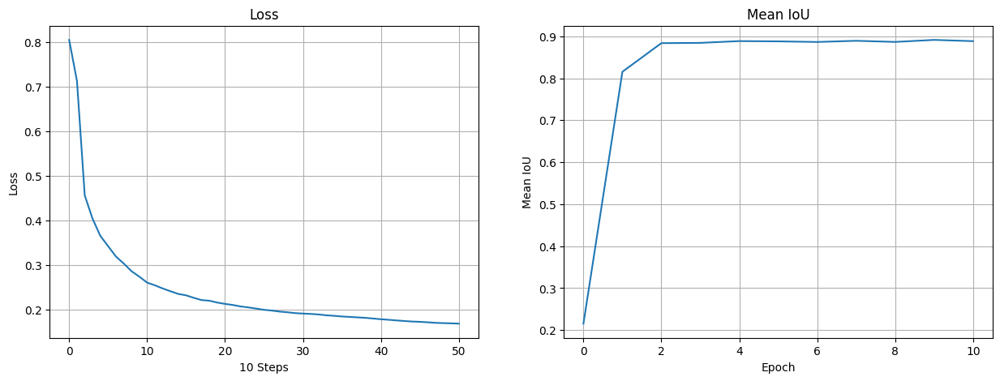

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(losses)
ax[0].set_title("Loss")
ax[0].set_xlabel("10 Steps")
ax[0].set_ylabel("Loss")
ax[0].grid()
ax[1].plot(miou)
ax[1].set_title("Mean IoU")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("Mean IoU")
ax[1].grid()
plt.show()

#### Save the model

In [51]:
# Save the model
model.save_pretrained("maskformer-flood_data_fine-tuned")

#### Inference on test dataset

In [52]:
batch = next(iter(test_dataloader))
# batch = next(iter(val_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))

pixel_values torch.Size([4, 3, 512, 512])
pixel_mask torch.Size([4, 512, 512])
mask_labels 4
class_labels 4
original_images 4
original_segmentation_maps 4


In [53]:
with torch.no_grad():
  outputs = model(batch["pixel_values"].to(device))
  
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)
ground_truth_segmentation_maps = batch["original_segmentation_maps"]

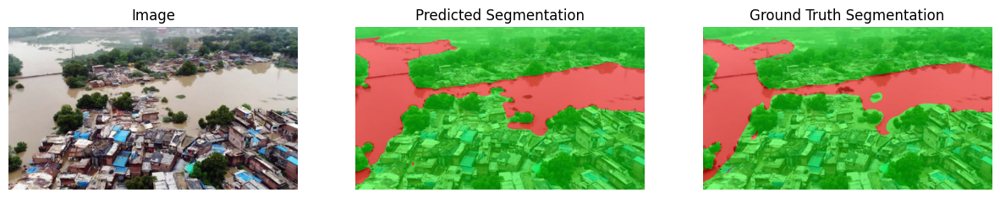

In [54]:
idx = 0
draw_true_predicted_segmentation(batch["original_images"][idx], predicted_segmentation_maps[idx],
                                 ground_truth_segmentation_maps[idx])

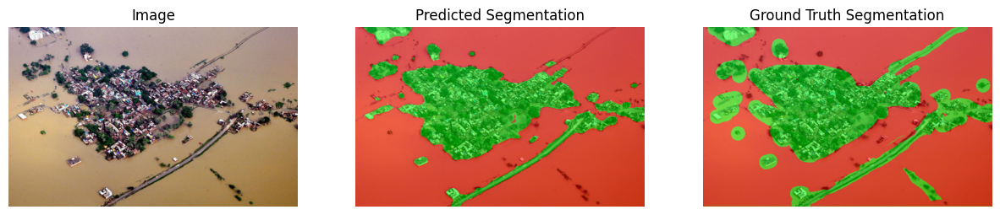

In [55]:
idx = 3
draw_true_predicted_segmentation(batch["original_images"][idx], predicted_segmentation_maps[idx],
                                 ground_truth_segmentation_maps[idx])

In [56]:
print("Prediction:")
predicted_segmentation_map = predicted_segmentation_maps[idx].cpu().numpy()
# Count the number of 1s in the predicted segmentation map
value, counts = np.unique(predicted_segmentation_map, return_counts=True)
for v, c in zip(value, counts):
    print(f"Label {v}: {c} pixels")
print(predicted_segmentation_map[:8, :8])
print("Ground Truth:")
print(ground_truth_segmentation_maps[idx][:8, :8])

Prediction:
Label 0: 238964 pixels
Label 1: 659836 pixels
[[1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]]
Ground Truth:
[[1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1 1]]


In [57]:
sh = predicted_segmentation_map.shape
np.sum(predicted_segmentation_map == ground_truth_segmentation_maps[idx]) / (sh[0]*sh[1])

np.float64(0.9073954161103693)

Evaluate on test dataset

In [58]:
evaluate_iou(model, test_dataloader, metric)


  0%|                                                                                                                                   | 0/15 [00:00<?, ?it/s]


  7%|████████▏                                                                                                                  | 1/15 [00:02<00:31,  2.23s/it]


 13%|████████████████▍                                                                                                          | 2/15 [00:06<00:42,  3.28s/it]


 20%|████████████████████████▌                                                                                                  | 3/15 [00:07<00:29,  2.50s/it]


 27%|████████████████████████████████▊                                                                                          | 4/15 [00:09<00:22,  2.09s/it]


 33%|█████████████████████████████████████████                                                                                  | 5/15 [00:10<00:19,  1.95s/it]


 40%|█████████████████████████████████████████████████▏                                                                         | 6/15 [00:12<00:15,  1.70s/it]


 47%|█████████████████████████████████████████████████████████▍                                                                 | 7/15 [00:14<00:14,  1.84s/it]


 53%|█████████████████████████████████████████████████████████████████▌                                                         | 8/15 [00:17<00:15,  2.24s/it]


 60%|█████████████████████████████████████████████████████████████████████████▊                                                 | 9/15 [00:19<00:13,  2.24s/it]


 67%|█████████████████████████████████████████████████████████████████████████████████▎                                        | 10/15 [00:20<00:09,  1.88s/it]


 73%|█████████████████████████████████████████████████████████████████████████████████████████▍                                | 11/15 [00:22<00:07,  1.98s/it]


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 12/15 [00:24<00:05,  1.95s/it]


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 13/15 [00:34<00:08,  4.38s/it]


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 14/15 [00:38<00:04,  4.14s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:51<00:00,  6.79s/it]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:51<00:00,  3.42s/it]

Mean IoU: 0.861079404657134


{'mean_iou': np.float64(0.861079404657134),
 'mean_accuracy': np.float64(0.9304764983018164),
 'overall_accuracy': np.float64(0.9317933980862717),
 'per_category_iou': array([0.90055538, 0.82160343]),
 'per_category_accuracy': array([0.93456845, 0.92638454])}

### Conclusion
- Pre-trained model:
    - mIoU: **21.5%** on validation set
- Fine-tuned model:
    - mIoU: **89.5%** on validation set
    - mIoU: **86.1%** on test set